In [38]:
import os
from glob import glob
import matplotlib.pyplot as plt
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import numpy as np

landsat_path = glob(
    os.path.join(
        "data",
        "LC08_L2SP_125059_20220401_20220406_02_T1",
        "LC08_L2SP_125059_20220401_20220406_02_T1_SR_B*_CROPPED.tif",
    )
)

In [2]:
landsat_path

['data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B1_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B2_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B3_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B4_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B5_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B6_CROPPED.TIF',
 'data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_SR_B7_CROPPED.TIF']

In [3]:
# really sick - earthpy has a function that automatically stacks all the raster files in a list of files
# note that setting nodata = 0 turns the array_stack into a masked array
array_stack, meta_data = es.stack(landsat_path, nodata = 0)

In [5]:
array_stack.shape

(7, 1112, 1823)

In [6]:
# generates a usable dictionary that can be passed to rasterio for file saving
meta_data

{'driver': 'GTiff', 'dtype': 'uint16', 'nodata': 0.0, 'width': 1823, 'height': 1112, 'count': 7, 'crs': CRS.from_epsg(32648), 'transform': Affine(30.0, 0.0, 344143.0,
       0.0, -30.0, 163234.0), 'blockysize': 2, 'tiled': False, 'compress': 'deflate', 'interleave': 'band'}

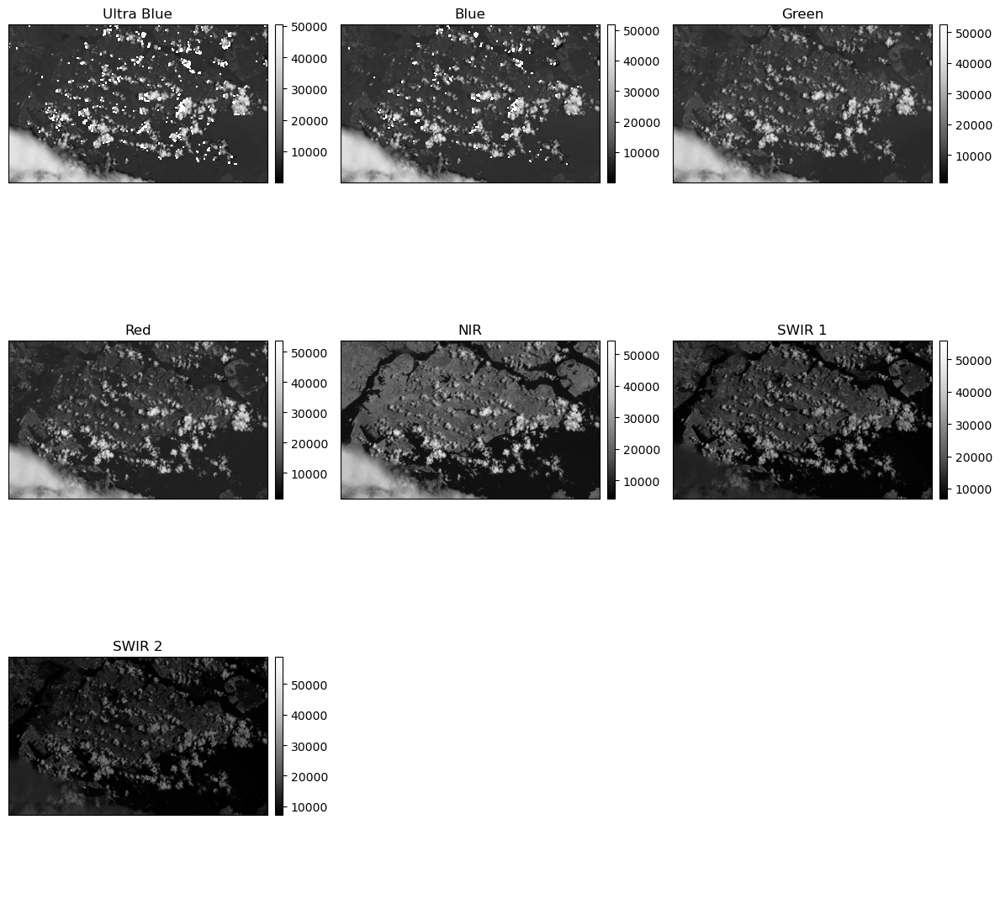

In [7]:
# When you give ep.plot_bands() a three dimensional numpy array, it will plot all layers in the numpy array. You can 
# create unique titles for each image by providing a list of titles using the title= parameter. The list must contain 
# the same number of strings as there are bands in the stack.

# you'll note that the values range from 1-65535. there is a specific formula that you must follow to convert these to 
# reflectances (0-1)

titles = ["Ultra Blue", "Blue", "Green", "Red", "NIR", "SWIR 1", "SWIR 2"]
# sphinx_gallery_thumbnail_number = 1
ep.plot_bands(array_stack, title=titles)
plt.show()

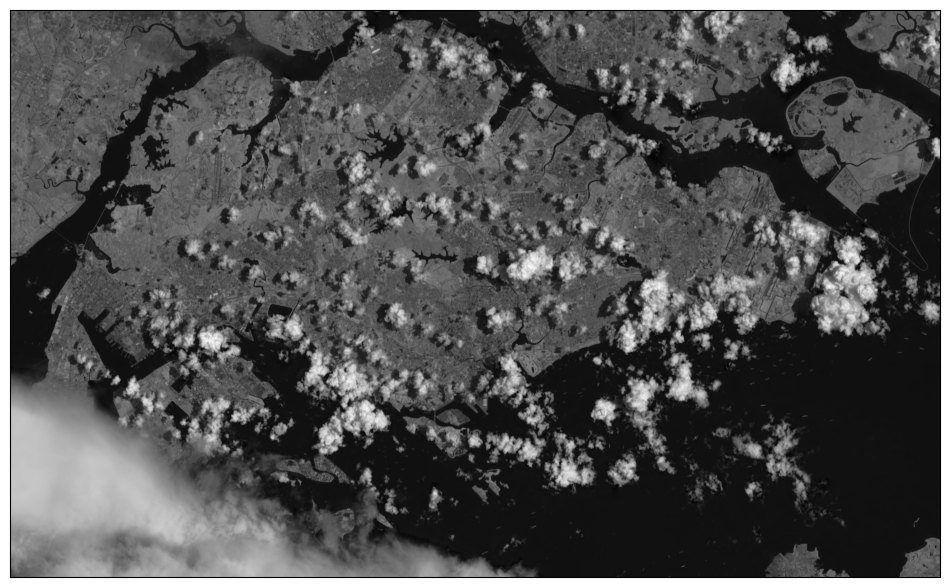

In [8]:
# If you give ep.plot_bands() a one dimensional numpy array, it will only plot that single band. You can turn off the 
# colorbar using the cbar parameter (cbar=False).

ep.plot_bands(array_stack[4], cbar=False)
plt.show()

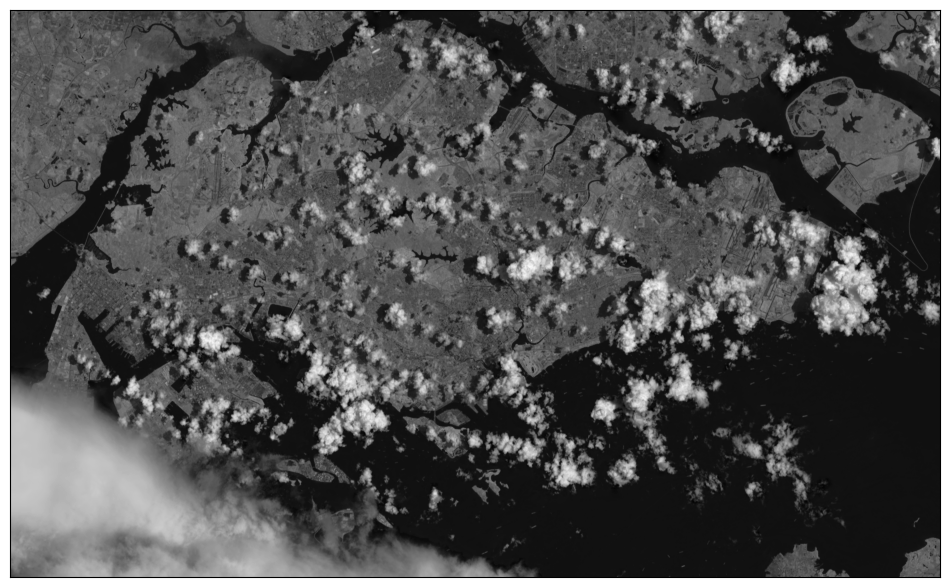

In [9]:
# ep.plot_bands() does not scale imagery to a 0-255 scale by default. However, often this range of values makes it 
# easier for matplotlib to plot the data. To turn on scaling, set the scale parameter to True. Below you plot band 5 
# of the satellite imagery with scaling turned on in order to see the data without the values being modified.

ep.plot_bands(array_stack[4], cbar=False, scale=True)
plt.show()

In [10]:
# really sick - earthpy has a function that automatically stacks all the raster files in a list of files
# it even has an out_path argument that you can use to specify a location to save the generated raster
array_stack, meta_data = es.stack(landsat_path, nodata = 0, out_path = "20220401_stacked.tif")

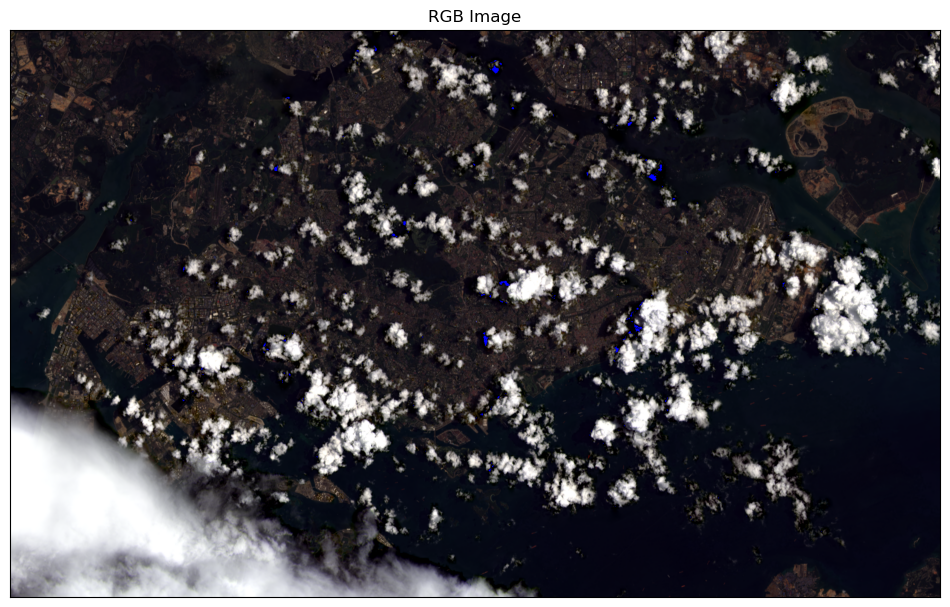

In [13]:
fig, ax = plt.subplots(figsize=(12, 12))
ep.plot_rgb(
    array_stack[[3,2,1],:,:],
    ax=ax,
    stretch=True,
    str_clip=2,
    title="RGB Image",
)
plt.show()

(<Figure size 1200x1200 with 4 Axes>,
 array([[<Axes: title={'center': 'Blue - No Data Values Removed'}>,
         <Axes: title={'center': 'Green - No Data Values Removed'}>],
        [<Axes: title={'center': 'Red - No Data Values Removed'}>,
         <Axes: >]], dtype=object))

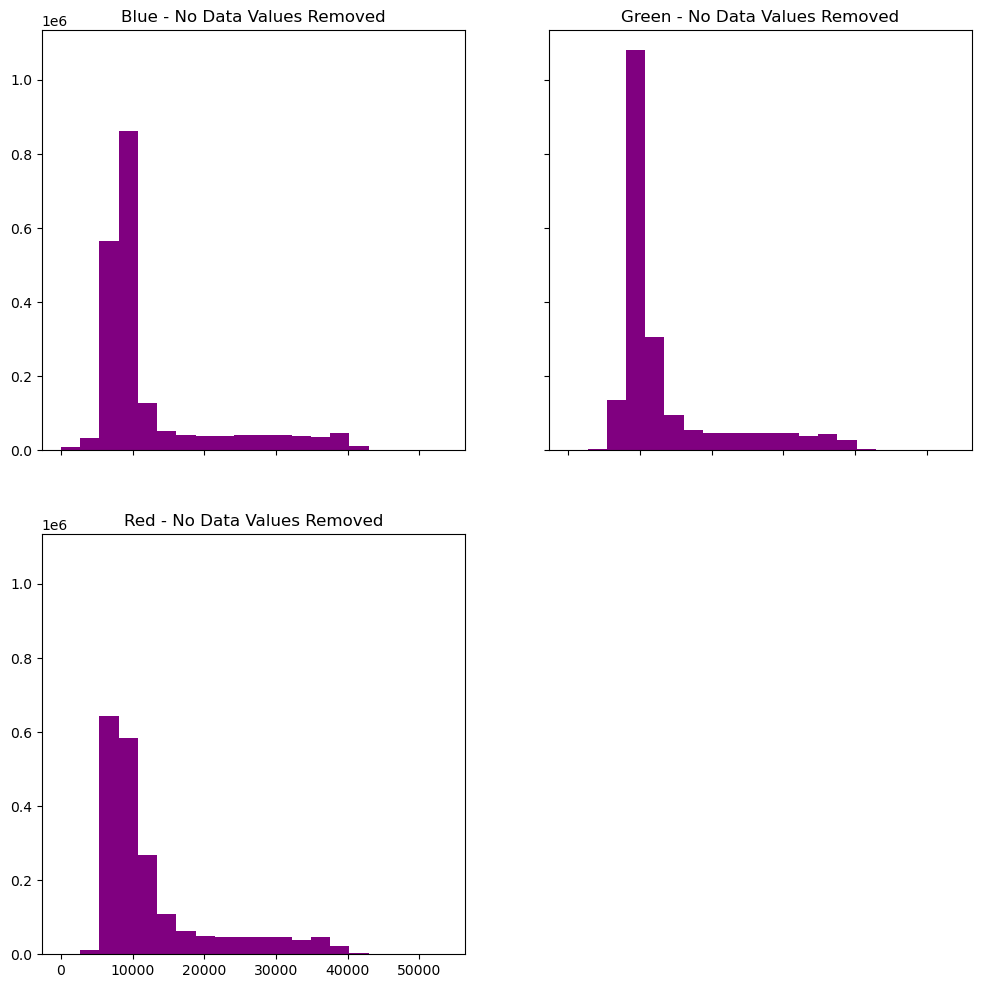

In [16]:
ep.hist(
    array_stack[[1,2,3],:,:],
    title=[
        "Blue - No Data Values Removed",
        "Green - No Data Values Removed",
        "Red - No Data Values Removed",
    ],
)

In [18]:
# the landsat qa pixel image is used as a mask for quality control, usually associated with the presence of clouds

# Import the landsat qa layer
import rasterio as rio

with rio.open(
    "C:\\Users\\Jonny\\Desktop\\Jupyter Projects\\Singapore NDVI\\data\\LC08_L2SP_125059_20220401_20220406_02_T1\\LC08_L2SP_125059_20220401_20220406_02_T1_QA_PIXEL_CROPPED.TIF"
) as landsat_pre_cl:
    landsat_qa = landsat_pre_cl.read(1)
landsat_pre_cl.close()

landsat_qa.shape

(1112, 1823)

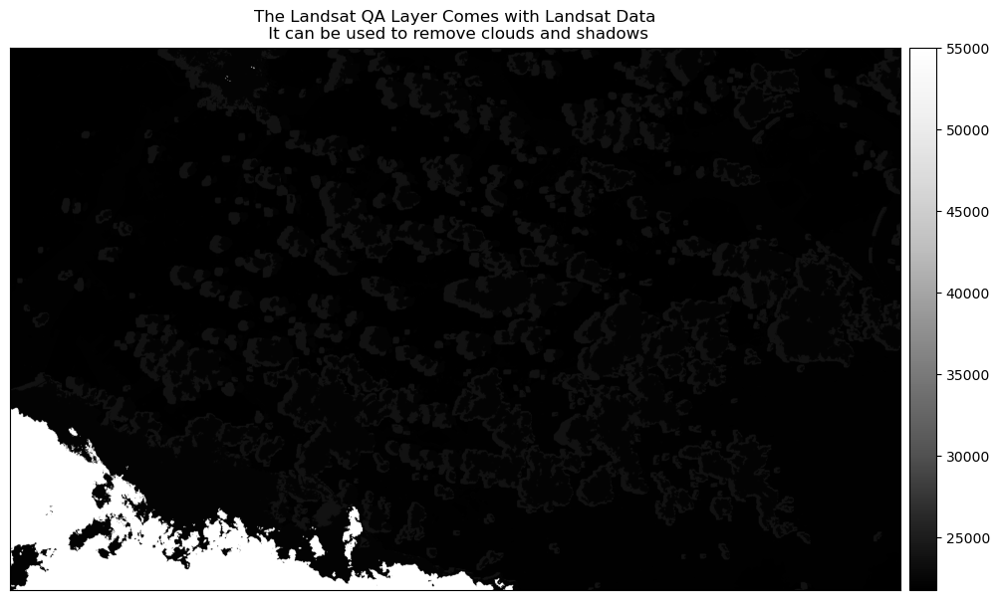

In [19]:
# we can see what this mask layer looks like

ep.plot_bands(
    landsat_qa,
    title="The Landsat QA Layer Comes with Landsat Data\n It can be used to remove clouds and shadows",
)
plt.show()

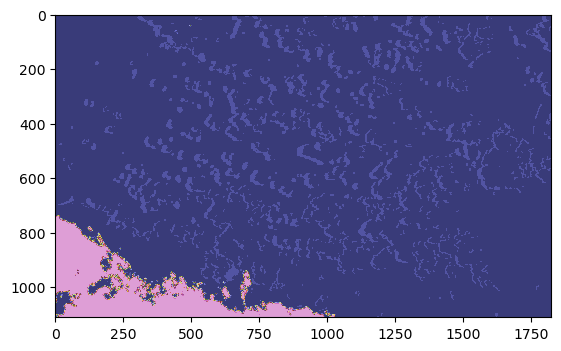

In [26]:
import matplotlib.pyplot as plt

plt.imshow(landsat_qa, cmap = "tab20b")

In [23]:
landsat_qa

array([[21824, 21824, 21824, ..., 22280, 22280, 22280],
       [21824, 21824, 21824, ..., 22280, 22280, 22280],
       [21824, 21824, 21824, ..., 22280, 22280, 22280],
       ...,
       [22280, 22280, 22280, ..., 21824, 21824, 21824],
       [22280, 22280, 22280, ..., 21824, 21824, 21824],
       [22280, 22280, 22280, ..., 21824, 21824, 21824]], dtype=uint16)

In [74]:
# note that em.pixel_flags is outdated - it can only be used for collection 1 level 1 data. 
# use the following to interpret
# https://www.usgs.gov/media/images/landsat-collection-2-pixel-quality-assessment-bit-index

# each number should be converted to a 16 bit binary number
# the first 8 numbers (bits) indicate the degree of confidence for the prsence of cirrus, snow/ice, cloud shadow, and clouds
# respectively (2 bits each) 
# NOTE: YOU NEED TO ADD ZEROS TO THE FRONT UNTIL THERE ARE 16 BITS
bin(21824)[2:].zfill(16)

'0101010101000000'

In [102]:
def qa_pixel_interp_aggressive(number):
    '''
    Helps interpret the 16bit data in the landsat qa pixels
    
    returns True if there is mid confidence cirrus, snow/ice, cloud shadow, OR clouds
    '''
    binary = bin(number)[2:].zfill(16)
    
    # if medium to high confidence cirrus, snow/ice, cloud shadow, and clouds
    if int(binary[:2]) > 1:
        return True
    elif int(binary[2:4]) > 1:
        return True
    elif int(binary[4:6]) > 1:
        return True
    elif int(binary[6:8]) > 1:
        return True
    else:
        return False

def array_for(x):
    return np.array([qa_pixel_interp_aggressive(xi) for xi in x])

In [103]:
unique_vals = np.unique(landsat_qa)

unique_vals

array([21762, 21764, 21765, ..., 53668, 54251, 55052], dtype=uint16)

In [104]:
masked_vals = array_for(unique_vals)

masked_vals

array([False, False, False, ...,  True,  True,  True])

In [105]:
#an array of all values that should be masked in the landsat_qa data
masked_vals = unique_vals[masked_vals]

masked_vals

array([22016, 22017, 22018, ..., 53668, 54251, 55052], dtype=uint16)

In [106]:
cl_mask = np.isin(landsat_qa, masked_vals)

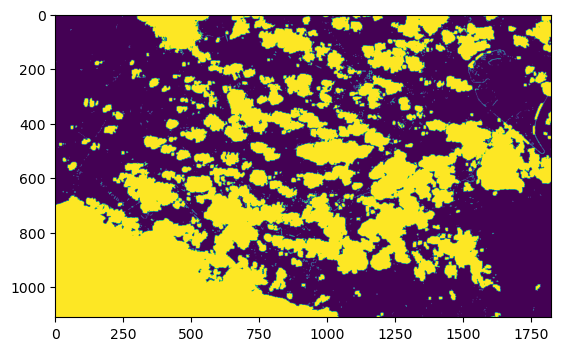

In [107]:
plt.imshow(cl_mask)

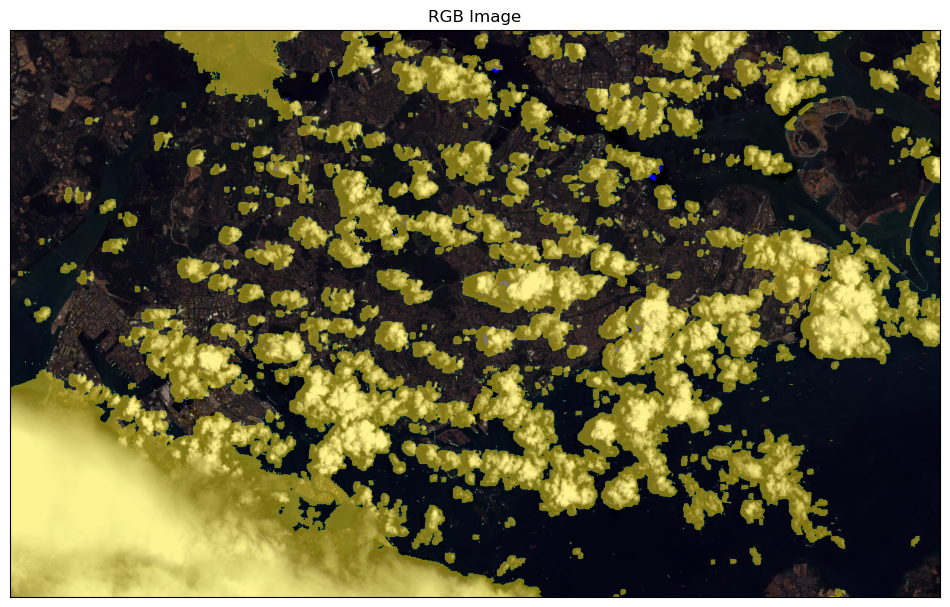

In [108]:
fig, ax = plt.subplots(figsize=(12, 12))
ep.plot_rgb(
    array_stack[[3,2,1],:,:],
    ax=ax,
    stretch=True,
    str_clip=2,
    title="RGB Image",
)
plt.imshow(cl_mask, alpha = 0.5 * cl_mask)
plt.show()

In [111]:
def qa_pixel_interp_conservative(number):
    '''
    Helps interpret the 16bit data in the landsat qa pixels
    
    returns True if there is mid confidence cirrus, snow/ice, cloud shadow, OR clouds
    '''
    binary = bin(number)[2:].zfill(16)
    
    # if high confidence cirrus, snow/ice, cloud shadow, and clouds
    # 01 - low, 10 - medium, 11 - high
    if int(binary[:2]) > 10:
        return True
    elif int(binary[2:4]) > 10:
        return True
    elif int(binary[4:6]) > 10:
        return True
    elif int(binary[6:8]) > 10:
        return True
    else:
        return False
    
def array_for_cons(x):
    return np.array([qa_pixel_interp_conservative(xi) for xi in x])

In [112]:
unique_vals = np.unique(landsat_qa)
masked_vals = array_for_cons(unique_vals)
masked_vals = unique_vals[masked_vals]
cl_mask_cons = np.isin(landsat_qa, masked_vals)

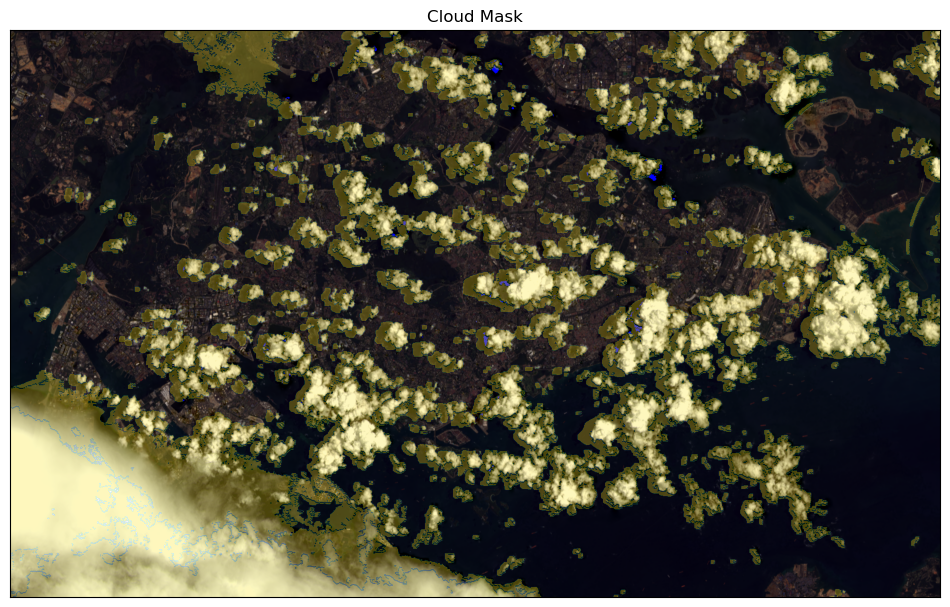

In [116]:
fig, ax = plt.subplots(figsize=(12, 12))
ep.plot_rgb(
    array_stack,
    rgb = (3,2,1),
    ax=ax,
    stretch=True,
    str_clip=2,
    title="Cloud Mask",
)
plt.imshow(cl_mask_cons, alpha = 0.3 * cl_mask_cons)
plt.show()

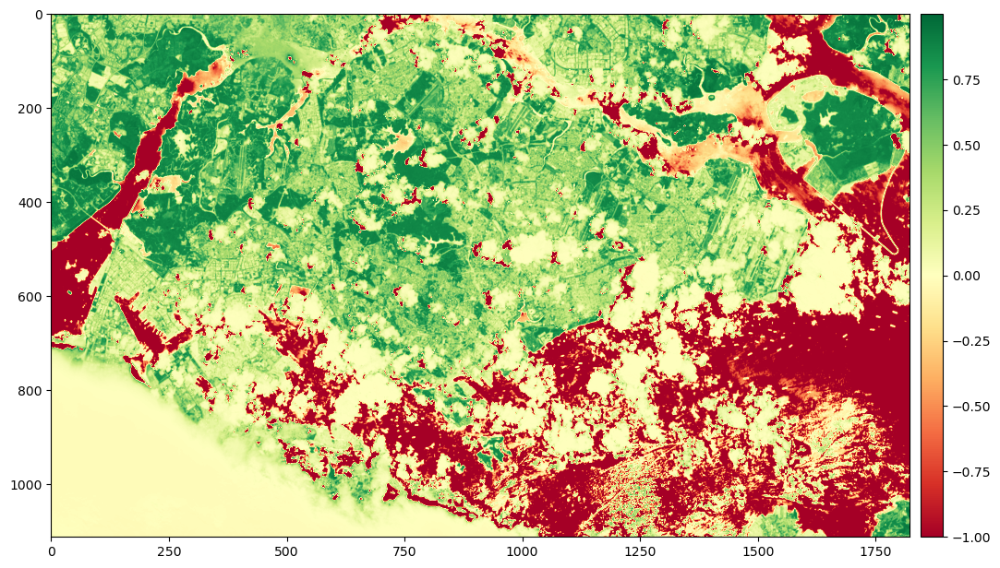

In [190]:
nir = array_stack[4] * 0.0000275 + -0.2
red = array_stack[3] * 0.0000275 + -0.2

# from scipy.signal import convolve2d

# nir[nir < 0] = 0
# red[red < 0] = 0

# # convolve the image, replacing all cases where nir = 0 with a guesstimate
# kernel = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]]) / 4
# nir_convolved = convolve2d(nir, kernel, mode='same')
# nir[nir == 0] = nir_convolved[nir == 0]

# # convolve the image, replacing all cases where nir = 0 with a guesstimate
# kernel = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]]) / 4
# red_convolved = convolve2d(red, kernel, mode='same')
# red[red == 0] = red_convolved[red == 0]



ndvi = (nir - red) / (nir + red)

# simplest solution easiest: if nir or red has <1 reflectance, set ndvi to -1
ndvi[(nir < 0) | (red < 0)] = -1

# landsat level 2 can have negative reflectances in water, leading to awful colors
# ndvi[(ndvi > 1) | (ndvi < -1)] = -1


fig, ax = plt.subplots(figsize = (12,12))
im = plt.imshow(ndvi, cmap = "RdYlGn")
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
fig.colorbar(im, cax = cax)

In [191]:
ndvi_masked = np.ma.array(ndvi, mask = cl_mask_cons)

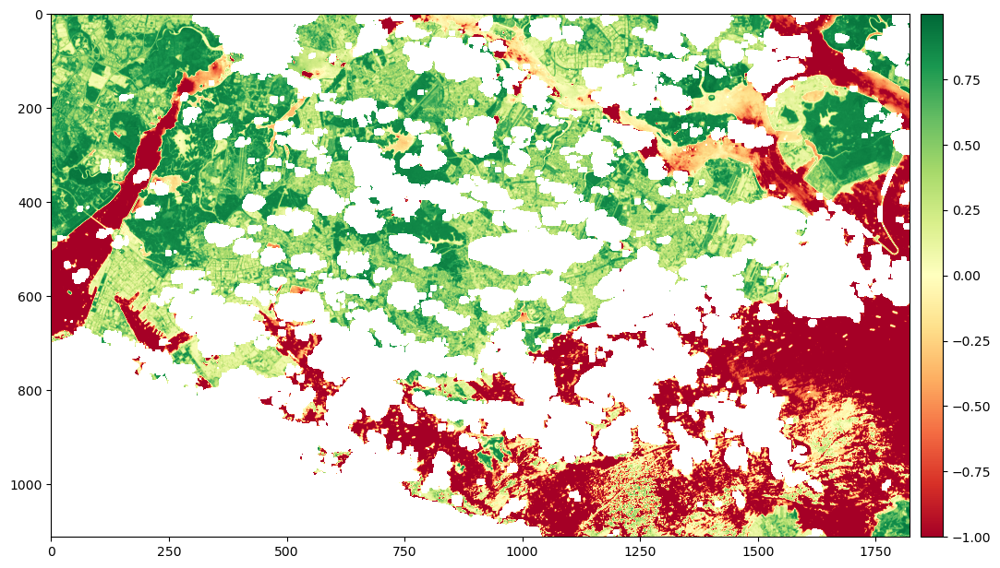

In [192]:
fig, ax = plt.subplots(figsize = (12,12))
im = plt.imshow(ndvi_masked, cmap = "RdYlGn")
cax = fig.add_axes([ax.get_position().x1+0.01,ax.get_position().y0,0.02,ax.get_position().height])
fig.colorbar(im, cax = cax)

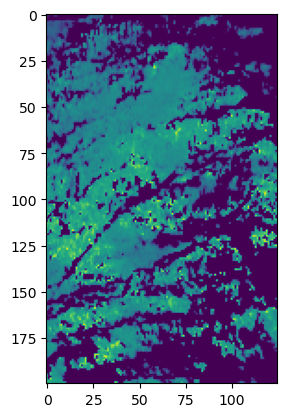

In [205]:
plt.imshow(ndvi[800:1000, 1625:1750])

In [207]:
nir[800:1000, 1625:1750][ndvi[800:1000, 1625:1750] > 0]

masked_array(data=[0.0005024999999999891, 0.0012449999999999961,
                   0.0012449999999999961, ..., 0.0025099999999999845,
                   0.00020000000000000573, 0.0029224999999999945],
             mask=[False, False, False, ..., False, False, False],
       fill_value=0)

In [208]:
red[800:1000, 1625:1750][ndvi[800:1000, 1625:1750] > 0]

masked_array(data=[0.0002824999999999911, 0.0011074999999999835,
                   0.0008874999999999855, ..., 0.0020425000000000026,
                   9.000000000000674e-05, 0.002537499999999998],
             mask=[False, False, False, ..., False, False, False],
       fill_value=0)

In [181]:
ndvi[ndvi > 0.9]

masked_array(data=[0.9653233919166816, 0.9956415555138078,
                   0.9629756338617104, ..., 1.0, 1.0, 0.9006047827775621],
             mask=[False, False, False, ..., False, False, False],
       fill_value=0)

In [182]:
red[ndvi > 0.9]

masked_array(data=[0.001464999999999994, 0.00014500000000000624,
                   0.0012174999999999825, ..., 0.0, 0.0,
                   0.02239250000000001],
             mask=[False, False, False, ..., False, False, False],
       fill_value=0)

In [183]:
nir[ndvi > 0.9]

masked_array(data=[0.08302999999999999, 0.06639250000000002, 0.06455, ...,
                   0.0003100000000000047, 7.937499999999958e-05,
                   0.42818249999999997],
             mask=[False, False, False, ..., False, False, False],
       fill_value=0)

In [184]:
np.mean(ndvi[ndvi>0])

0.4174695638030277

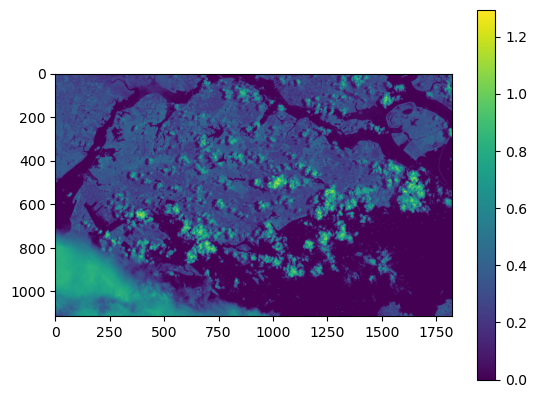

In [177]:
nir = array_stack[4] * 0.0000275 + -0.2
red = array_stack[3] * 0.0000275 + -0.2

from scipy.signal import convolve2d

nir[nir < 0] = 0
red[red < 0] = 0

# convolve the image
kernel = np.array([[0, 1, 0], [1, 0, 1], [0, 1, 0]]) / 4
nir_convolved = convolve2d(nir, kernel, mode='same')
nir[nir == 0] = nir_convolved[nir == 0]

im = plt.imshow(nir)
fig.colorbar(im)

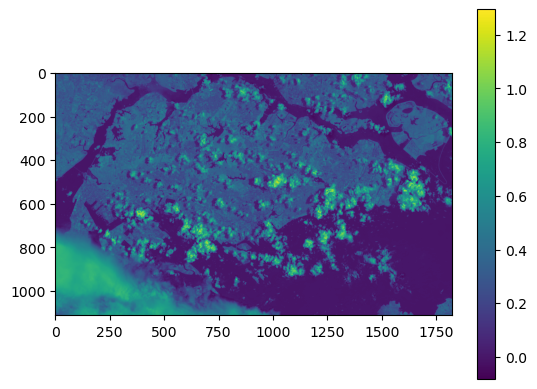

In [187]:
im = plt.imshow(array_stack[4] * 0.0000275 - 0.2)
fig.colorbar(im)

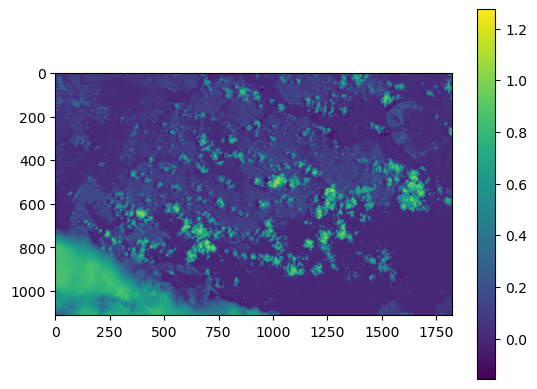

In [188]:
im = plt.imshow(array_stack[3] * 0.0000275 - 0.2)
fig.colorbar(im)

In [209]:
from rasterio.plot import reshape_as_image

def histogram_stretch(img, min_vals = None, max_vals = 99):
    """
    Performs a histogram_stretch on an image. DO NOT use this for analytical workflows - 
    this should only be used to improve image visualization
    
    img: an unmasked 3D raster 
    
    min_vals: percentile that you wish to crop to
        will be np.zeros by default
    max_vals: percentile that you wish to crop to
        will be np.nanpercentile(img, 99) by default # crops to 99th percentile
    """
    if img.ndim != 3:
        print("ValueError: Your raster must have three dimensions.")
        return
    
    # This returns the max_valth percentile
    max_vals = np.nanpercentile(img, max_vals, axis = (1,2)).reshape(img.shape[0],1,1) 
    # min_vals = np.nanmin(tcc_toa, axis = (1,2)).reshape(3,1,1) # Use this to stretch to minimum values
    if min_vals is not None:
        min_vals = np.nanpercentile(img, min_vals, axis = (1,2)).reshape(img.shape[0],1,1)
    else:
        min_vals = np.zeros(img.shape[0]).reshape(img.shape[0],1,1)
    
    # Perform normalization
    img_stretched = (img - min_vals) / (max_vals - min_vals)
    
    # Clip values above 1
    img_stretched[img_stretched > 1] = 1
    
    return img_stretched

scaled_stack = array_stack * 0.0000275 - 0.2
tcc = reshape_as_image(histogram_stretch(scaled_stack[[3,2,1],:,:], 0, 95))

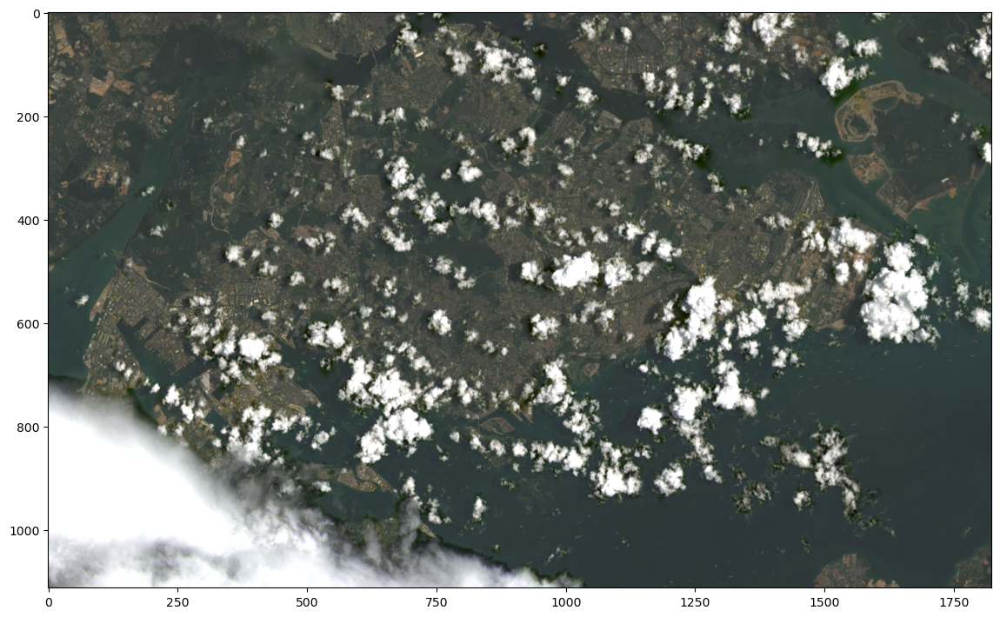

In [210]:
# from rasterio.plot import reshape_as_image

# scaled_stack = array_stack * 0.0000275 - 0.2
# tcc = reshape_as_image(histogram_stretch(scaled_stack[[3,2,1],:,:], 0, 99))

fig, ax = plt.subplots(figsize = (14,14))
plt.imshow(tcc)

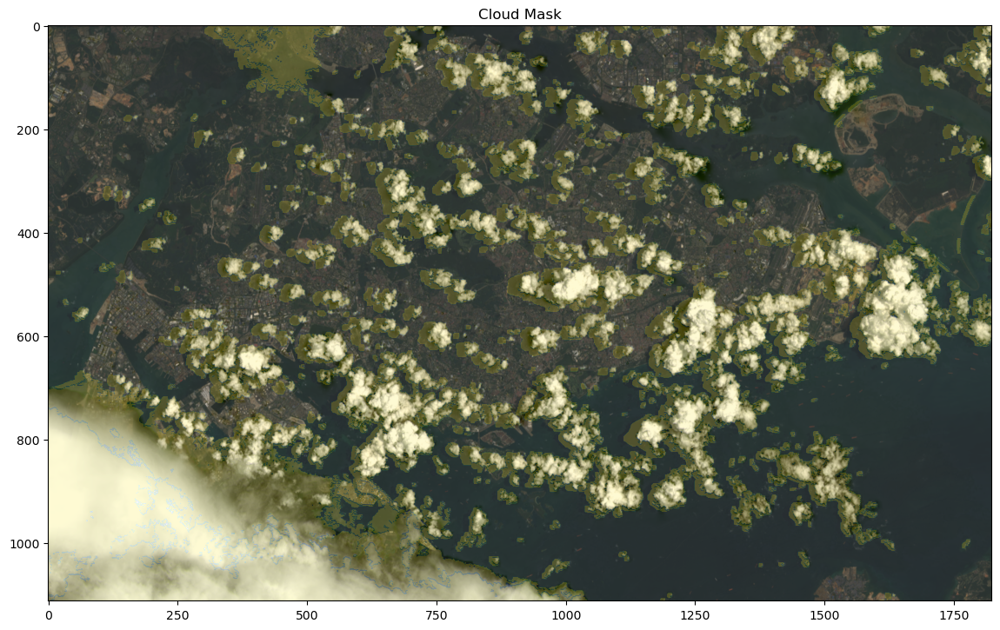

In [203]:
fig, ax = plt.subplots(figsize=(14, 14))
plt.imshow(
    tcc
)
plt.imshow(cl_mask_cons, alpha = 0.2 * cl_mask_cons)
plt.title("Cloud Mask")
plt.show()

(<Figure size 1200x1200 with 8 Axes>,
 array([[<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >],
        [<Axes: >, <Axes: >]], dtype=object))

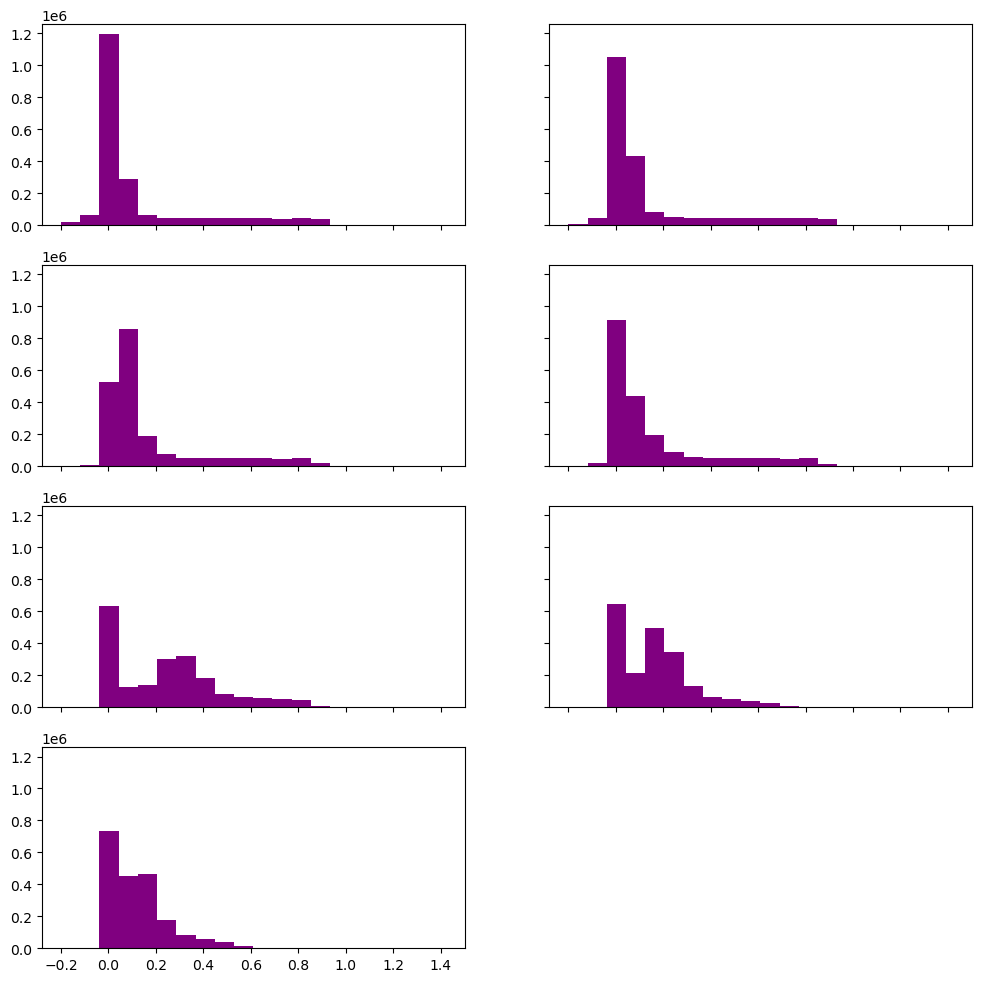

In [195]:
ep.hist(scaled_stack)